# Setup

In [3]:
%matplotlib inline

In [4]:
import os
import pathlib

import einops
import IPython.display
import matplotlib.pyplot as plt
import numpy
import torch
import torchvision
import tqdm


# Utils
def save_gif(images, path, duration=10):
    images[0].save(
        path,
        save_all=True,
        append_images=images[1:],
        duration=duration,
        loop=0,
    )


def display_tensor_list(tensor_list: list[torch.Tensor]) -> None:
    grid = torchvision.utils.make_grid(tensor_list, nrow=8)
    grid_img = torchvision.transforms.ToPILImage()(grid)
    display(grid_img)


# Setup
numpy.random.seed(21)
torch.manual_seed(94)
torch.set_default_device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_tensor_type("torch.cuda.FloatTensor")

DATASET_DIR = os.getenv("DATASET_DIR")
MODEL_DIR = os.getenv("MODEL_DIR")
N_EPOCH = int(os.getenv("N_EPOCH"))
N_EXP = int(os.getenv("N_EXP"))
print("N_EPOCH: ", N_EPOCH)
print("N_EXP: ", N_EXP)

b, c, h, w = tuple(eval(os.getenv("BCHW")))

print("b, c, h, w: ", b, c, h, w)


N_EPOCH:  2000
N_EXP:  32
b, c, h, w:  256 12 64 64


In [ ]:
save_dir = pathlib.Path(f"{MODEL_DIR}/{numpy.random.randint(1e8)}")
save_dir.mkdir(parents=True, exist_ok=True)

## Dataset

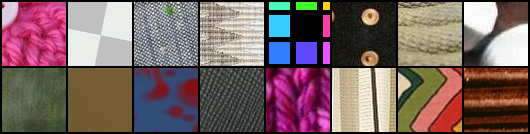

In [6]:
dataset_transform = torchvision.transforms.Compose(
    [torchvision.transforms.ToTensor(), torchvision.transforms.CenterCrop((h, w))]
)

train_dataset = torchvision.datasets.DTD(
    root=DATASET_DIR, transform=dataset_transform, download=True
)
sample_idx = numpy.random.choice(len(train_dataset), N_EXP, replace=False)
dataset_sample = [train_dataset[i][0] for i in sample_idx]
display_tensor_list(dataset_sample[:16])


## Losses

In [7]:
def get_style_loss(target: torch.Tensor, params: dict):
    # Build style loss from specific target tensor
    target_styles = vgg_styles(target, params)

    def style_loss(x: torch.Tensor) -> torch.Tensor:
        x_styles = vgg_styles(x, params)
        return sum(opt_transport_loss(x, y) for (x, y) in zip(x_styles, target_styles))

    return style_loss


def vgg_styles(x: torch.Tensor, params: dict) -> list[torch.Tensor]:
    # Extract features from a tensor
    x = params["transform"](x)
    features = [x]
    for i, layer in enumerate(params["model"][: max(params["layers"]) + 1]):
        x = layer(x)
        if i in params["layers"]:
            features.append(x)
    return features


def opt_transport_loss(
    source: torch.Tensor, target: torch.Tensor, proj_dim: int = 32
) -> torch.Tensor:
    # Sliced wasserstein loss (optimal transport) https://arxiv.org/pdf/2006.07229.pdf
    source = source.flatten(-2)
    target = target.flatten(-2)
    c, f = source.shape[-2:]
    style_w = torch.nn.functional.normalize(torch.randn(c, proj_dim), dim=0)
    source_proj = torch.einsum("bcf,cp->bpf", source, style_w).sort()[0]
    target_proj = torch.einsum("bcf,cp->bpf", target, style_w).sort()[0]
    target_proj = torch.nn.functional.interpolate(target_proj, f, mode="nearest")
    loss = (source_proj - target_proj.detach()).square().sum()
    return loss


def overflow_loss(x: torch.Tensor) -> torch.Tensor:
    loss = (x - x.clamp(-1.0, 1.0)).abs().sum()
    return loss


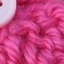

In [8]:
style_params = {
    "model": torchvision.models.vgg16(weights="IMAGENET1K_V1").features,
    "layers": [1, 6, 11, 18, 25],
    "transform": torchvision.transforms.Normalize(
        [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
    ),
}
style_tensor = dataset_sample[0]
style_tensor = style_tensor.unsqueeze(0).to(torch.device("cuda"))
style_img = torchvision.transforms.ToPILImage()(style_tensor[0])
style_img.save(save_dir / "texture.png")
display(style_img)

texture_loss = get_style_loss(style_tensor, style_params)


## Model

In [9]:
class Perception(torch.nn.Module):
    def __init__(self) -> None:
        super().__init__()

        Ki = torch.tensor([[0, 0, 0], [0, 1, 0], [0, 0, 0]])
        Kx = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
        Klap = 0.25 * torch.tensor([[1, 2, 1], [2, -12, 2], [1, 2, 1]])

        self.register_buffer("filters", torch.stack([Ki, Kx, Kx.T, Klap])[:, None])

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        c = x.shape[1]
        x = einops.rearrange(x, "b c h w -> (b c) () h w")
        x = torch.nn.functional.pad(x, [1, 1, 1, 1], "circular")  # Keep same size
        x = torch.nn.functional.conv2d(x, self.filters)
        x = einops.rearrange(x, "(b c) k h w -> b (k c) h w", k=4, c=c)
        return x


class Evolution(torch.nn.Module):
    def __init__(self, n: int) -> None:
        super().__init__()

        self.conv1 = torch.nn.Conv2d(4 * n, 2 * 4 * n, kernel_size=1)
        self.conv2 = torch.nn.Conv2d(2 * 4 * n, n, kernel_size=1, bias=False)
        self.conv2.weight.data.zero_()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ds = self.conv2(torch.relu(self.conv1(x)))
        return ds


class CellularAutomata(torch.nn.Module):
    def __init__(self, n: int) -> None:
        super().__init__()

        self.perception = Perception()
        self.evolution = Evolution(n)

    def forward(self, s: torch.Tensor) -> torch.Tensor:
        x = self.perception(s)
        ds = self.evolution(x)
        update_mask = torch.randn_like(x[:, :1, :, :]) > 0

        return s + ds * update_mask


In [10]:
ca = CellularAutomata(c)
optimizer = torch.optim.Adam(ca.parameters(), lr=1e-3, capturable=True)
lr_sched = torch.optim.lr_scheduler.MultiStepLR(optimizer, [1000, 2000], 0.3)
pool = torch.zeros((b, c, h, w))
print(ca)
print("N parameters:", sum(p.numel() for p in ca.parameters()))


CellularAutomata(
  (perception): Perception()
  (evolution): Evolution(
    (conv1): Conv2d(48, 96, kernel_size=(1, 1), stride=(1, 1))
    (conv2): Conv2d(96, 12, kernel_size=(1, 1), stride=(1, 1), bias=False)
  )
)
N parameters: 5856


## Training

In [11]:
losses = []
for i in tqdm.trange(N_EPOCH):
    batch_idx = numpy.random.choice(len(pool), 4, replace=False)
    x = pool[batch_idx]
    if i % 8 == 0:
        x[:1] = 0
    step_n = numpy.random.randint(32, 96)
    for k in range(step_n):
        x = ca(x)

    loss = texture_loss(x[:, :3] + 0.5) + overflow_loss(x)
    loss.backward()
    for p in ca.parameters():
        p.grad /= p.grad.norm() + 1e-8
    optimizer.step()
    optimizer.zero_grad()
    lr_sched.step()
    pool[batch_idx] = x.detach()

    losses.append(loss.item())

torch.save(ca.state_dict(), f"{save_dir}/model.pt")


100%|██████████| 2000/2000 [01:58<00:00, 16.84it/s]


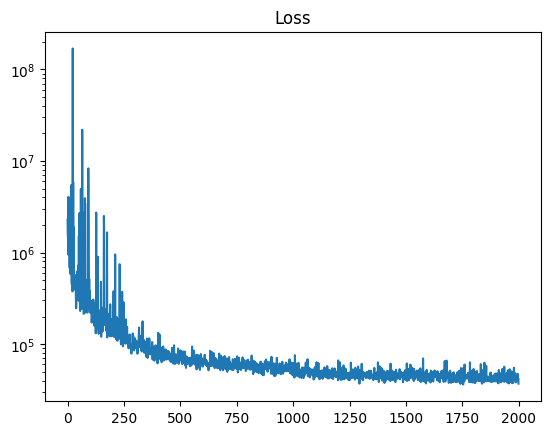

In [12]:
plt.plot(losses)
plt.title("Loss")
plt.yscale("log")


## Results

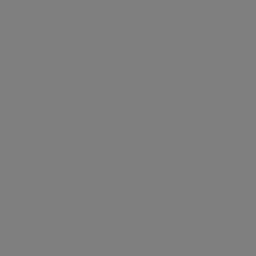

In [13]:
# Make evolution gif
with torch.no_grad():
    imgs = []
    st = torch.zeros((1, c, 4 * h, 4 * w))
    for i in range(2000):
        if i % 10 == 0:
            imgs.append(torchvision.transforms.ToPILImage()(st[0, :3] + 0.5))
        st = ca(st)

save_gif(imgs, save_dir / f"generation.gif")
IPython.display.Image(save_dir / f"generation.gif")
